## Real Case "SMALL DATA"

<img src='https://frenzy86.s3.eu-west-2.amazonaws.com/python/img/tom1.png' width=900>

<img src='https://frenzy86.s3.eu-west-2.amazonaws.com/python/img/tom2.png' width=900>

In [3]:
#!wget https://frenzy86.s3.eu-west-2.amazonaws.com/python/data/realcase/dataset_costi.xlsx

#Target colonna "costi anno 2020"

In [4]:
path = 'https://frenzy86.s3.eu-west-2.amazonaws.com/python/data/realcase/dataset_costi.xlsx'

<img src='https://frenzy86.s3.eu-west-2.amazonaws.com/python/data/pandas_.png' width=500>

In [5]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score,root_mean_squared_error
from sklearn.preprocessing import OneHotEncoder

from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import ElasticNet

In [6]:
def bool_encoding(colonna, *args):
    dict = {}
    for idx, i in enumerate(args):
        dict[i] = idx
    
    colonna = colonna.map(dict)
    return colonna
    

In [ ]:
from sklearn.preprocessing import OneHotEncoder

def onehotencoder(df, columns1, name_columns):
    onehotencoder = OneHotEncoder(sparse_output = False)
    arrayy = onehotencoder.fit_transform(columns1.values.reshape(-1,1))
    df_array = pd.DataFrame(arrayy)
    df_encoded = pd.concat([df, df_array], axis=1, join="inner")

    for idx, i in enumerate(df_array.columns):
        df_encoded = df_encoded.rename(columns={idx:f"{name_columns}_{columns1[df_encoded[idx] == 1].unique()[0]}"})
    
    df_encoded = df_encoded.drop(name_columns, axis=1)
    
    return df_encoded

In [8]:
pd.set_option('display.max_rows', 500)
pd.set_option('display.max_columns', 500)
pd.set_option('display.width', 1000)

In [9]:
df = pd.read_excel("dataset_costi.xlsx")

In [10]:
df

,index,Ragione sociale,costi anno 2020,var1,var2,var3,var4,var5,var6,var7,var8,var9,var10,var11,var12,var13,var14,var15,var16,var17,var18,var19,var20,var21,var22,var23,var24,var25,var26,var27,var28,var29,var30,var31,var32,var33,var34,var35,var36,var37,var38,var39,var40,var41,var42,var43,var44,var45,var46,var47,var48,var49,var50,var51,var52,var53,var54,var55,var56,var57,var58,var59,var60,var61,var62,var63,var64,var65,var66,var67,var68,var69,var70,var71,var72,var73,var74,var75,var76,var77,var78,var79,var80,var81,var82,var83,var84,var85,var86,var87,var88,var89,var90,var91,var92,var93,var94,var95,var96,var97,var98,var99,var100,var101,var102,var103,var104,var105,var106,var107,var108,var109,var110,var111,var112,var113,var114,var115,var116,var117,var118,var119,var120,var121,var122,var123,var124,var125,var126,var127,var128,var129,var130,var131,var132,var133,var134,var135,var136,var137,var138,var139,var140,var141,var142,var143,var144,var145,var146,var147,var148,var149,var150,var151,var152,ATECO 2007\ncodice,Indirizzo sede legale,Indirizzo sede legale - Codice postale,Indirizzo sede legale - Comune,Provincia,Indirizzo sede legale - Regione,Numero CCIAA,Codice fiscale,Partita IVA,var153,var154,var155,var156,var157,var158,var159
0,101,company101,144205134,147823139,148193655,0,0,0,51344312,61401789,71387976,23064675,20882011,14244395,2794279,2677799,2833077,14562964,14352577,8073273,0,0,0,0,0,73273,0,0,0,9312470,7915379,7272270,35436524,37191289,32749686,32719851,34723462,30111298,0,0,0,84978,318158,318158,0,0,0,7834908,2178851,18788146,290899,188430,570560,141846752,144110326,153086306,69193271,72220512,85886434,4033074,4033074,4033074,8874677,9644129,10513852,812758,940485,1060351,62928609,61236117,54359909,25290616,24108358,24535319,0,0,0,0,0,0,0,158005,154528,0,0,158005,29565517,29302779,22500461,0,0,0,37437,69083,1265760,145914503,148992105,149021406,1135448,1033613,392038,85824629,86758885,83651116,30573391,27161965,27459901,1892059,1841524,1807968,13310780,13264428,12114005,14296757,13558421,13421133,-823170,-507756,-530593,0,46982,114473,0,0,0,1228034,977093,1122097,783131,572136,267603,1588604,1604455,1856974,36310,-66672,135970,0,0,0,0,0,0,1870101,3257494,4594656,n.d.,n.d.,n.d.,-3027241,1534078,3813249,229,214,207,zyx56973,via abc112,abc445,Nerviano,Milano,Lombardia,20680,256,10696,84978,318158,318158,25290616,24108358,24535319,Produ
1,102,company102,140165127,147562322,163251010,0,0,0,1037776,1391301,1602930,23503659,22973259,20946238,13368527,12404318,11085331,1850794,1693511,1060485,364872,1287356,811956,1485922,406155,248529,0,0,0,34529004,35683884,35340902,23391321,22915530,18886264,10795833,11017483,11177585,1583,1583,1588,1583,1583,1588,355977,43180,471450,5293624,2889766,1616895,408806,551290,687712,90370961,88141721,80612876,21212948,18327864,16372048,9000000,9000000,8000000,539412,878366,1154727,555689,586514,594299,65207408,68150008,62242345,14133394,10404117,12898505,29430949,39612215,32870407,14133394,10404117,12898505,29430949,39612215,32870407,14133394,10404117,12898505,16595959,12520527,13143079,0,0,0,2855504,198969,249457,142727898,150222876,166417107,2028227,778100,3166950,102237238,113037130,131392006,11501816,11119691,13728039,1290053,1340018,1338016,16889643,15833127,15986500,2713441,2434423,2180861,3207072,1304536,-3015558,0,0,627379,0,0,0,912728,1042592,1058524,80006,47390,35171,769967,895916,1201286,11943,82820,1553908,0,0,0,0,0,0,1373420,1220932,1304576,n.d.,n.d.,n.d.,1924469,2124721,2204557,454,411,456,zyx56974,via abc113,abc446,Milano,Milano,Lombardia,20681,257,10697,1583,1583,1588,14133394,10404117,12898505,Produ
2,103,company103,145190000,147562000,142652000,0,0,0,737000,707000,745000,51250000,51604000,50992000,23900000,25404000,26269000,69000,66000,56000,0,0,0,0,0,0,0,0,0,17498000,12270000,12954000,31359000,47731000,43044000,26022000,43298000,39653000,0,0,0,1801000,1761000,1171000,3000,3000,0,19082000,4224000,5958000,1596000,7000,0,121594000,116612000,113749000,24965000,25707000,23690000,5933000,593

In [11]:
df = df.drop(["Ragione sociale","Indirizzo sede legale","Indirizzo sede legale - Codice postale", "Numero CCIAA","Codice fiscale","Partita IVA", "var159", "index", "ATECO 2007\ncodice", "var93"], axis=1)

In [12]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7924 entries, 0 to 7923
Columns: 161 entries, costi anno 2020 to var158
dtypes: int64(63), object(98)
memory usage: 9.7+ MB


In [13]:
df.isnull().sum()

costi anno 2020                    0
var1                               0
var2                               0
var3                               0
var4                               0
var5                               0
var6                               0
var7                               0
var8                               0
var9                               0
var10                              0
var11                              0
var12                              0
var13                              0
var14                              0
var15                              0
var16                              0
var17                              0
var18                              0
var19                              0
var20                              0
var21                              0
var22                              0
var23                              0
var24                              0
var25                              0
var26                              0
v

----

## prova

C:\Users\lucam\AppData\Local\Temp\ipykernel_27088\1175863490.py:1: FutureWarning:

The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.



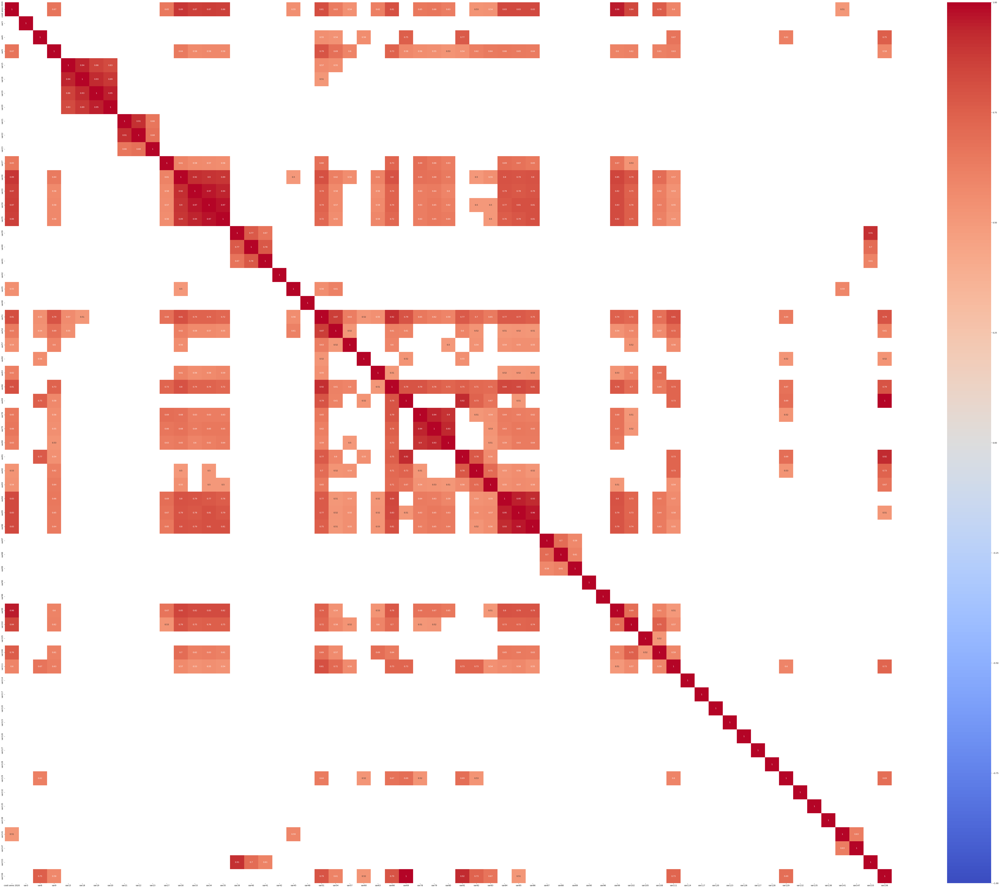

In [14]:

correlation_matrix = df.corr()
mask = correlation_matrix.abs() < 0.5
filtered_corr = correlation_matrix.mask(mask)

plt.figure(figsize=(100, 80))

sns.heatmap(filtered_corr, annot=True, cmap="coolwarm", vmin=-1, vmax=1, mask=mask, cbar=True)

plt.show()

C:\Users\lucam\AppData\Local\Temp\ipykernel_27088\2380301696.py:2: FutureWarning:

The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.



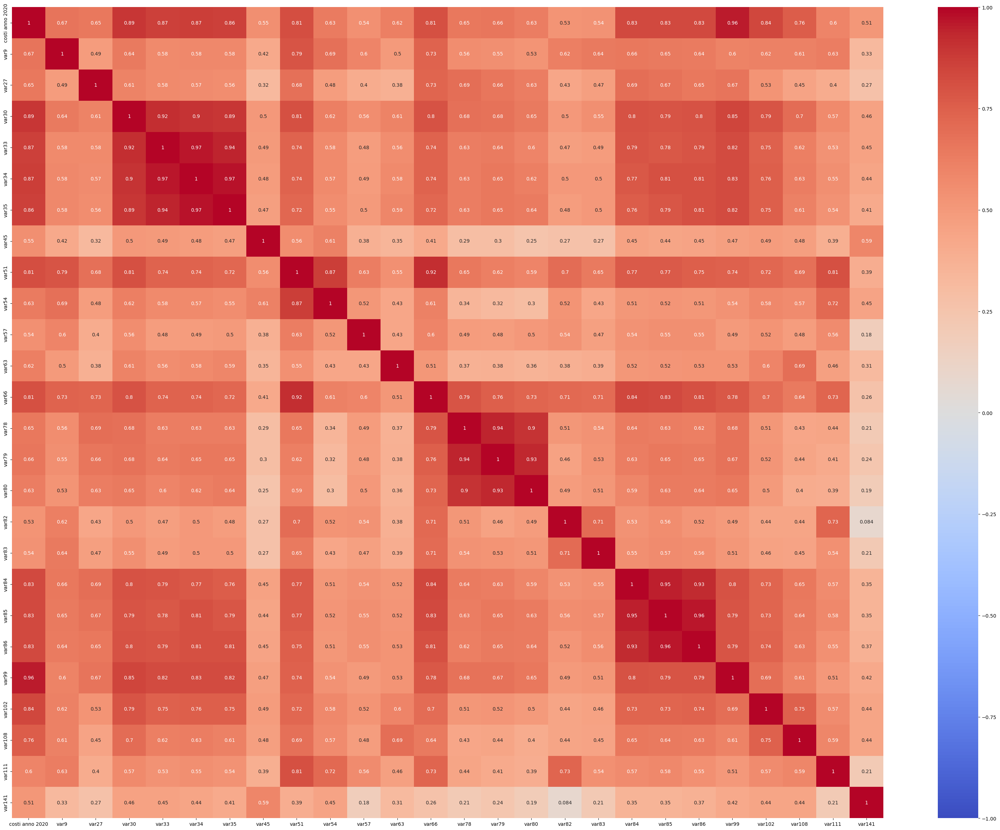

In [15]:
target = 'costi anno 2020'
correlation_matrix = df.corr()

target_corr = correlation_matrix[target]
high_corr_features = target_corr[abs(target_corr) > 0.5].index

filtered_corr_matrix = correlation_matrix.loc[high_corr_features, high_corr_features]

plt.figure(figsize=(40, 30))

sns.heatmap(filtered_corr_matrix, annot=True, cmap="coolwarm", vmin=-1, vmax=1, cbar=True)

plt.show()

In [16]:
df_filtered = df[high_corr_features]

In [17]:
df_filtered

,costi anno 2020,var9,var27,var30,var33,var34,var35,var45,var51,var54,var57,var63,var66,var78,var79,var80,var82,var83,var84,var85,var86,var99,var102,var108,var111,var141
0,144205134,23064675,9312470,35436524,32719851,34723462,30111298,7834908,141846752,69193271,4033074,812758,62928609,0,158005,154528,0,158005,29565517,29302779,22500461,85824629,30573391,13310780,14296757,1870101
1,140165127,23503659,34529004,23391321,10795833,11017483,11177585,5293624,90370961,21212948,9000000,555689,65207408,29430949,39612215,32870407,10404117,12898505,16595959,12520527,13143079,102237238,11501816,16889643,2713441,1373420
2,145190000,51250000,17498000,31359000,26022000,43298000,39653000,19082000,121594000,24965000,5933000,685000,91688000,24578000,29507000,25272000,22494000,24687000,32357000,28219000,30630000,117422000,21643000,9901000,3832000,9000
3,112760368,5258584,25923161,21948953,15584991,15576621,23831452,185206,54024787,11928401,1976000,516863,40609649,26719881,24599616,25292061,0,1188439,10388151,9719252,11365649,105779603,10515673,3075383,631775,80381
4,171980718,65670888,18950865,8362491,4425910,11432236,11013435,14381920,117725617,15404312,12000000,896335,100872660,32695485,32841802,30745665,23559197,23666222,38983227,32661501,28307414,149110551,11984035,6335628,5310610,472994
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7919,81879,0,0,106391,0,0,0,7878,123149,30614,10000,0,92535,0,0,0,0,0,0,0,0,9325,26777,38607,375,9054
7920,80757,0,0,76547,0,0,0,44648,122695,17905,10000,0,104790,0,0,0,0,0,0,0,0,5850,36142,46571,375,5063
7921,74478,0,26100,26659,0,0,0,3175,67671,9331,10000,920,57420,0,0,0,0,0,0,0,0,57496,12679,20126,632,0
7922,0,16295937,0,2392696,13965,0,0,100,18760521,3047157,5279220,0,15703900,1306367,0,0,0,0,294256,0,0,0,27625,0,705926,-25766


In [18]:
target = "costi anno 2020"

X = df_filtered.drop(target,axis=1).values
y = df_filtered[target].values

In [19]:
X_train, X_test, y_train, y_test = train_test_split(X,y,
                                                    test_size=0.25,
                                                    random_state=667,
                                                    )

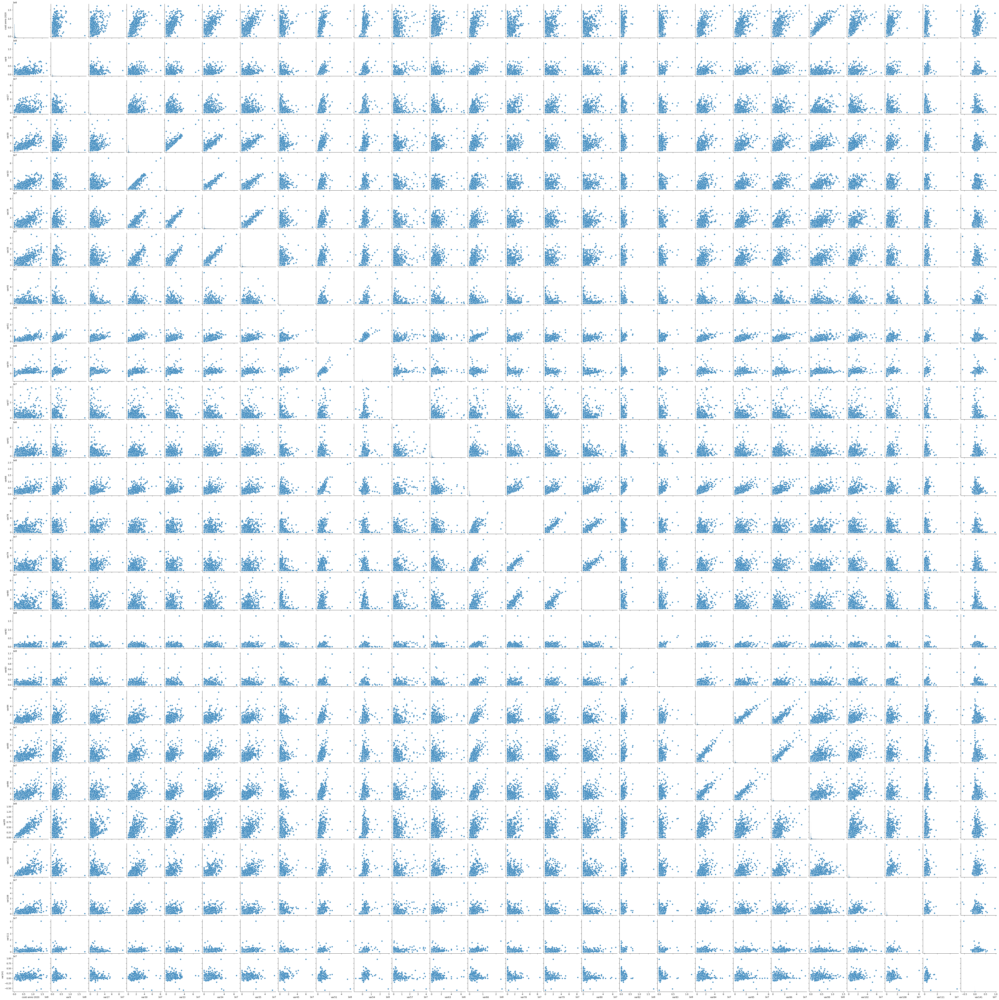

In [20]:
sns.pairplot(data=df_filtered)

In [21]:
from sklearn.linear_model import LinearRegression

In [22]:
model = LinearRegression()

In [23]:
model.fit(X_train, y_train)

LinearRegression()

In [24]:
y_pred = model.predict(X_test)

In [25]:
from sklearn.metrics import mean_squared_error, r2_score,root_mean_squared_error, mean_absolute_error, mean_absolute_percentage_error

mae = mean_absolute_error(y_test, y_pred)

mape = mean_absolute_percentage_error(y_test, y_pred)

mse = mean_squared_error(y_test, y_pred)

rmse = root_mean_squared_error(y_test, y_pred)

r2 = r2_score(y_test, y_pred)

In [26]:
print(mae)
print(mape)
print(mse)
print(rmse)
print(r2)


361944.8481479231
5.41774860339335e+18
1098732802002.8594
1048204.5611438921
0.9962311773403588


In [27]:
import plotly.graph_objects as go

In [28]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=X, y=y_test, name="real", mode="lines"))
fig.add_trace(go.Scatter(x=X, y=y_pred, name="predicted", mode="lines"))
fig.update_layout(title="Error from prediction on Test Set", xaxis_title="Obeservation", yaxis_title="Value",width=900)
fig.show()


In [ ]:
coef = model.coef_
model.intercept_

-3954.9400213966146

In [46]:
coef

array([-0.0588876 , -0.07346193, -0.19167666,  0.35066081, -0.16819407,
        0.07888236,  0.06048935,  0.08842772, -0.02980706, -0.05328583,
        0.12322113, -0.05276794, -0.04420482,  0.1135713 , -0.12881023,
        0.10062193, -0.0837372 , -0.21618844,  0.16218738,  0.07575396,
        0.98747638,  1.06159891,  1.17302715,  0.27703254,  2.6397188 ])

In [36]:
from sklearn.model_selection import cross_val_score

In [47]:
cross_val_score(model, X,y,cv=5, scoring='r2')

array([0.98803987, 0.93889559, 0.85978019, 0.97091306, 0.9893548 ])

In [48]:
len(y)

7924

In [49]:
import pickle

In [ ]:
import joblib
joblib.dump(model,"modello.pkl")

['modello.pkl']

In [69]:
modello2 = joblib.load("modello.pkl")

In [70]:
modello2

LinearRegression()